In [1]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import boxcox
from scipy.special import inv_boxcox

from sklearn.linear_model import Ridge, Lasso
from sklearn import tree
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, GridSearchCV
import statsmodels.api as sm
from scipy.stats.stats import pearsonr
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
from sklearn.externals.six import StringIO  
from IPython.display import Image  

import pydotplus

import webscraper, data_cleansing, feature_engineering
sns.set()

# Webscraping Data

Over the past few years, the online Auctioning site BringATrailer.com has hosted tens of thousands of auctions for used cars. Many of these cars are Oldtimers, i.e. thirty or more years old. While each auction page is created by the seller (and is anything but standardized), I created a Webscraper to scrape features that are relevant to the ultimate price of the car. These include kilometers driven, model, engine, and decade built. The Webscraper works in two steps

1. It creates a list of links to all past auction result pages
2. It scrape each auction result page individually, and compiles the Data in a Pandas DataFrame

Below, we run the Webscraper and collect data from 10,000+ Auction results

In [25]:
# Create a csv of links to Oldtimer Auction results
webscraper.scrape_oldtimer_links()

SessionNotCreatedException: Message: session not created: This version of ChromeDriver only supports Chrome version 76


In [14]:
# Read links to Auction results into a list
auction_result_links_df = pd.read_csv('./datasets/auction_result_links.csv')
auction_result_links = list(auction_result_links_df.url)

In [17]:
# Scrape individual Pages of Auction results for Oldtimer Details.
oldtimer_df = webscraper.scrape_oldtimer_auction_results(auction_result_links)

['https://bringatrailer.com/listing/2003-mercedes-benz-g500-7/',
 'https://bringatrailer.com/listing/1968-ford-mustang-39/',
 'https://bringatrailer.com/listing/1966-chevrolet-corvette-27/',
 'https://bringatrailer.com/listing/1967-mercedes-benz-230sl-9/',
 'https://bringatrailer.com/listing/2005-mercedes-benz-g55-amg-grand-edition/',
 'https://bringatrailer.com/listing/recaro-2/',
 'https://bringatrailer.com/listing/2014-porsche-cayman-5/',
 'https://bringatrailer.com/listing/1966-meyers-manx/',
 'https://bringatrailer.com/listing/1984-porsche-944-32/',
 'https://bringatrailer.com/listing/1986-porsche-944-turbo-80/',
 'https://bringatrailer.com/listing/2003-mini-cooper-s-18/',
 'https://bringatrailer.com/listing/1972-fiat-500-19/',
 'https://bringatrailer.com/listing/1993-mercedes-benz-300ce-13/',
 'https://bringatrailer.com/listing/1999-ferrari-360-modena-3/',
 'https://bringatrailer.com/listing/2001-audi-s4-26/',
 'https://bringatrailer.com/listing/1975-datsun-280z-13/',
 'https://b

# Data Preprocessing

The Webscraped Data is anything but clean. It contains cars that are not in running condition, significant outliers in price and number of Kilometers driven. All the categorical features also have to be one-hot encoded, including the Model, and the engine type. This is done using helper functions in the data_cleansing.py and feature_engineering.py files.

There are also more than 200+ models in the complete Dataset. In order to build a reasonable Linear Model, we will only focus on cars built by Porsche.

In [32]:
oldtimer_df = pd.read_csv('./datasets/oldtimers.csv')

In [33]:
oldtimer_df.head(3)

,Lot Number,Chassis Number,Running Condition,Seller,Location,Model,Year,Kilometers,Engine,Gearbox,Date,Price
0,20950.0,WDCYR49E03X141381,True,1600veloce,"North Salem, New York 10560",Mercedes-Benz Gelandewagen,2003.0,88000.0,5.0L V8,5-Speed Automatic Transmission,2019-07-16,43750.0
1,17145.0,8R01C166900,True,Ty_Cary,"Mercer Island, Washington 98040",Ford Mustang 1967-1968,1968.0,22000.0,302ci V8,4-Speed Manual Gearbox,2019-03-18,11000.0
2,15914.0,194376S112973,True,SLGGR,"Topeka, Kansas 66614",Chevrolet Corvette C2,1966.0,72000.0,Numbers-Matching 427ci L72 V8,4-Speed Manual Transmission,2019-01-30,83000.0


In [34]:
#Almost eight thousand entries
len(oldtimer_df)

8101

In [35]:
# Drops rows with missing values, cars that aren't in working condition, etc.
oldtimer_df = data_cleansing.cleanse_data(oldtimer_df)

/Users/lucasastorian/PycharmProjects/OldtimerPricePrediction/data_cleansing.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df["Running Condition"] = df["Running Condition"].astype(bool)
/Users/lucasastorian/PycharmProjects/OldtimerPricePrediction/data_cleansing.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  df["Year"] = df["Year"].astype(int)
/Users/lucasastorian/PycharmProjects/OldtimerPricePrediction/data_cleansing.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

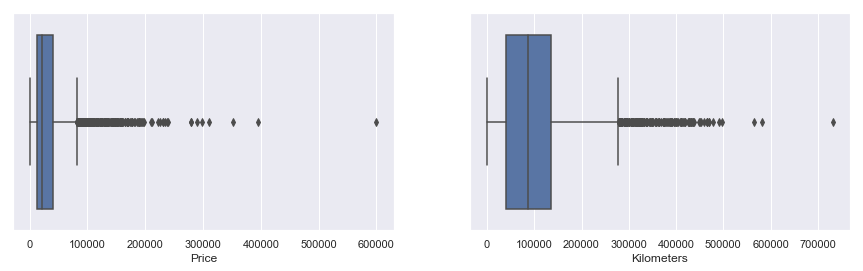

In [36]:
# There are some significant outliers in Price and the nunber of Kilometers Driven.
plt.rcParams["figure.figsize"] = (15,4)
fig, ax =plt.subplots(1,2)
sns.boxplot(oldtimer_df.Price, ax=ax[0]);
sns.boxplot(oldtimer_df.Kilometers, ax=ax[1]);

In [37]:
# Over 200 unique car models. That's too many to one-hot encode...
oldtimer_df.Model.nunique()

244

In [38]:
# Instead let's just focus on Porsche
porsche_df = oldtimer_df.loc[oldtimer_df["Model"].str.contains('Porsche')]

In [39]:
# Now we only have 24 Unique Models
porsche_df.Model.nunique()

24

In [40]:
# We remove oldtimers that cost more than $250,000,
# and oldtimers that have driven more than 450,000 kilometers
porsche_df = data_cleansing.remove_outliers(porsche_df)

In [41]:
# But still more than 13,000 entries
len(porsche_df)

1094

In [42]:
# We one-hot model, engine and gearbox features
porsche_df = feature_engineering.engineer_basic_features(porsche_df)
porsche_df = feature_engineering.engineer_engine_features(porsche_df)

In [43]:
# the final list of features
print(list(porsche_df.columns))

['Kilometers', 'Price', 'Intercept', 'Gearbox', 'Year', 'Porsche 944', 'Porsche 944 Turbo', 'Porsche 964 911', 'Porsche 996 911', 'Porsche 993 911', 'Porsche Impact Bumper 911', 'Porsche 930 Turbo', 'Porsche Longhood 911', 'Porsche 997 911', 'Porsche 356', 'Porsche 914', 'Porsche Boxster', 'Porsche 928', 'Porsche 993 Turbo', 'Porsche 968', 'Porsche 964 Turbo', 'Porsche GT3', 'Porsche 996 911 Turbo', 'Porsche 997 Turbo', 'Porsche 356 Speedster', 'Porsche 912', 'Porsche 924', 'Porsche 991 911', 1980, 1990, 2000, 1970, 1960, 1950, 2018, 'Engine Rebuilt', 'Twin Turbocharged', 'Engine Turbocharged', 'Original Engine', '2.5L', '3.6L', 'Other', '3.3L', '3.2L', '2.4L', '3.4L', '3.0L', '1.6L', '3.8L', '4.5L', '5.0L', '1.8L', '2.0L', '2.9L', '2.2L', '5.7L', '4.7L', '4.0L', '1.7L', '3.5L', '5.4L', 'Flat Six', 'Flat Four', 'Inline Four', 'V8']


## Normalizing Price and Kilometers Driven

Kilometers driven is not normally distributed. I apply a Box Cox transformation to normalize it, and improve the fit of the Linear Model.

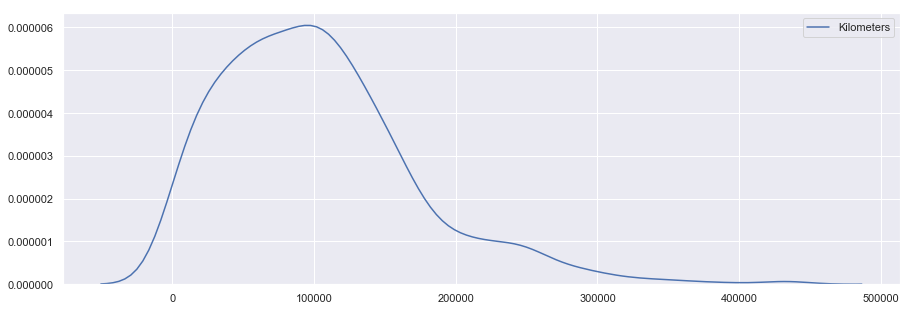

In [77]:
plt.rcParams["figure.figsize"] = (15,5)
#fig, ax = plt.subplots(1,2)
#sns.kdeplot(porsche_df.Price, ax=ax[0]);
sns.kdeplot(porsche_df.Kilometers);

In [75]:
#Create two Transformed Columns
porsche_df["logkilometers"], kilometers_lambda = boxcox(porsche_df["Kilometers"])

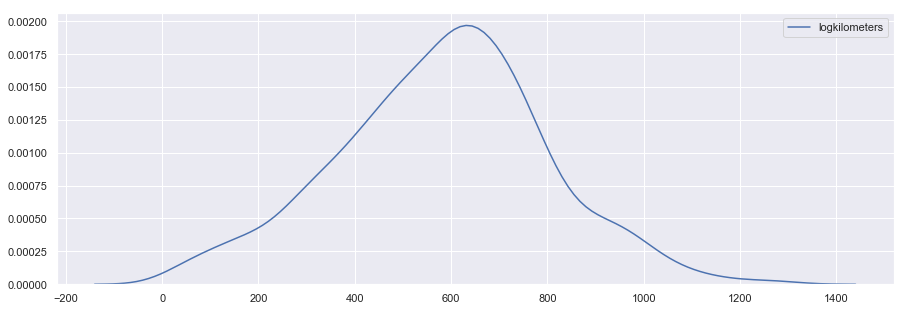

In [78]:
plt.rcParams["figure.figsize"] = (15,5)
sns.kdeplot(porsche_df.logkilometers);

# Modeling

I will try out a range of different Linear models including Linear, Ridge, Lasso, and ElasticNet Regression with Cross-Validation. I will also try out Decision Trees and Random Forests as most of the data is categorical, and has been one hot encoded.

# Linear Regression

I am going to create a linear model to predict the price of a Porsche at Auction using features webscraped from BringATrailer.com. These features include the total number of kilometers driven, the model of the car, the decade it was built, the type and size of engine, and whether the engine is original, and whether it was ever rebuilt. Almost all of these features are categorical and have been one-hot encoded. This leads to a very large Condition Number as the Model is highly sensitive to errors in input - a different model car changes the price prediction significantly. 

The Linear Regression model also assumes that:

1. The predictor - response Relationship is Linear
2. The error terms are uncorrelated
3. The error terms have constant variance
4. There are few or no significant outliers
5. There are no observations with high leverage.
6. Predictor Variables aren't significantly colinear with one another

As we build the model, we will be sure to make sure these assumptions have been met.

In [47]:
X = porsche_df.drop(["Price", "Kilometers", "logprice", "Gearbox", "Year"], axis=1)
y = porsche_df["Price"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [48]:
lsm = sm.OLS(y_train, X_train)
fit = lsm.fit()
fit.summary()
fit.save("linear_model.pickle")

# Model Interpretation
Statsmodels provides a large number summary metrics and statistics after the fit. Here's what I'm looking at.

* The F-Statistic is very high, so we can reject the null hypothesis that there is no relationship between any of the predictors and the target variable
* The P-Value for most of the predictor variables is close to zero with some notable exceptions. Some models, such as the Porsche 993 Turbo have high p-values, suggesting that they are not statistically significant to the overall model 
* The coefficient for logkilometers is negative, suggesting that (as expected) the value of a car depreciates the more it's been driven. However, as the feature has been transformed using Boxcox, this coefficient doesn't actually tell us by how much it decreases
* The high Omnibus shows that the Error terms are normally distributed - there's no skew or excess kurtosis
* There's a slight positive skew, and some Kurtosis
* The condition number is high, but this is expected as most of the data is one-hot encoded, and there is some multicollinearity

In [49]:
# Create a confidence interval for each prediction
predictions = fit.get_prediction(X_test)
predictions.summary_frame(alpha=0.05).head()

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
3509,57143.987061,5412.737208,46519.399987,67768.574134,15175.186138,99112.787983
1099,66993.021261,4597.488312,57968.674981,76017.367542,25400.507197,108585.535326
713,48652.060746,2407.445137,43926.519950,53377.601541,7776.283858,89527.837633
6880,58802.004134,7140.003727,44786.989477,72817.018790,15849.483414,101754.524854
5356,27249.402398,3978.625324,19439.813725,35058.991070,-14096.553579,68595.358374


In [48]:
# Calculate Mean Squared Error for the Test Set
y_pred = fit.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
adj_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("Mean Squared Error: ", mse)
print("R^2 Score: ", r_squared)
print('Adj. R^2 Score: ', adj_r_squared)

Mean Squared Error:  0.9761559304276131
R^2 Score:  0.7956144327359802
Adj. R^2 Score:  0.779737378805483


In [49]:
results = pd.DataFrame(columns=['Model', 'Hyperparameters', 'R^2', 'Adj. R^2', 'MSE'])
results = results.append({'Model' : 'Linear Regression', 'Hyperparameters' : '', "R^2" : r_squared, 
                'Adj. R^2' : adj_r_squared, "MSE" : mse}, ignore_index=True)
results.head()

,Model,Hyperparameters,R^2,Adj. R^2,MSE
0,Linear Regression,,0.795614,0.779737,0.976156


# Model Evaluation


## 1. Non-Linearity in the Data
We plot the residuals for each of the Predictor variables in order to identify non-linear relationships in the data. There is no discernable pattern for logkilometers, i.e. the feature we created by transforming the number of kilometers a car has driven. Thus, the relationship between logprice and logkilometers seems to be quite linear. We can't evaluate the residuals for all the other features that have been one-hot encoded.

In [53]:
@interact
def show_residuals(column = widgets.IntSlider(min=1, max=62, step=1, value=62)):
    return sns.residplot(X.iloc[:, column], y, lowess=True, color='g');

interactive(children=(IntSlider(value=62, description='column', max=62, min=1), Output()), _dom_classes=('widg…

## 2. Correlation of Error Terms
As there isn't a strong time-series component in auction data from various different cars, it's rather unlikely that the error terms are correlated. Moreover, the Durbin-Watson statistic, which tests for autocorrelation with lag 1, is not substantially less than 2 at 1.955

## 3. Non-Constant Variance in Error Terms (Heteroskedasticity)
A funnel shape in the residual plots indicates that the variance in error terms isn't constant. While this isn't the case for logkilometers, we can't do residual analysis for all the one-hot encoded variables. 

## 4. Precense of Outliers
Most of the obvious outliers including cars that sold for more than $250,000 and had driven for more than 450,000 kilometers were removed during preprocessing. There also aren't any visible outliers in the residual plot for Logkilometers. Variables that have been one-hot encoded, by definition, can't have outliers.

## 5. High Leverage Points
Given the residual plot for log-kilometers, there are no obvious points with high leverage. One-hot encoded variables can't have high leverage by definition.

## 6. Collinearity
Linear Regression assumes that none of the features are collienar. This presents a bit of a problem, as many of the features in this model are inherently somewhat collinear. For example, the Pearson Correlation between the "Porsche Impact Bumper 911", and "1980" is .45 as most of the Porsche's in that series were built between 1980 and 1990. However, there doesn't seem to be a serious problem with Colinearity.


In [24]:
pearsonr(X['Porsche Impact Bumper 911'], X[1980])

(0.4514104593747422, 4.934502479818482e-56)

# Ridge Regression

Let's also try  Ridge Regression using a grid-search and cross-validation with 5 folds.

In [25]:
alpha_values = np.linspace(0, 1, 1000)
ridge_regressor = Ridge()
grid = GridSearchCV(estimator=ridge_regressor, param_grid=dict(alpha=alpha_values), cv=5)
grid.fit(X_train, y_train)

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, random_state=None, solver='auto', tol=0.001),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': array([0.   , 0.001, ..., 0.999, 1.   ])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [30]:
print(grid.best_score_)

0.7326052947511492


In [31]:
print(grid.best_estimator_.alpha)

0.026026026026026026


In [34]:
y_pred = grid.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
adj_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("Mean Squared Error: ", mse)
print("R^2 Score: ", r_squared)
print('Adj. R^2 Score: ', adj_r_squared)

Mean Squared Error:  1.0577330605072575
R^2 Score:  0.778533977157746
Adj. R^2 Score:  0.7625014675286748


In [35]:
results = results.append({'Model' : 'Ridge Regression', 'Hyperparameters' : str(round(grid.best_estimator_.alpha, 3)), 
                          "R^2" : r_squared, 'Adj. R^2' : adj_r_squared, "MSE" : mse}, ignore_index=True)
results.head()

,Model,Hyperparameters,R^2,Adj. R^2,MSE
0,Linear Regression,,0.777543,0.761438,1.062468
1,Ridge Regression,0.026,0.778534,0.762501,1.057733


# Lasso Regression

In [36]:
alpha_values = np.linspace(0,1,1000)
lasso_regressor = Lasso()
grid = GridSearchCV(estimator=lasso_regressor, param_grid=dict(alpha=alpha_values), cv=5)
grid.fit(X_train, y_train)

/Users/lucasastorian/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator
  estimator.fit(X_train, y_train, **fit_params)
/Users/lucasastorian/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:478: UserWarning: Coordinate descent with no regularization may lead to unexpected results and is discouraged.
  positive)
/Users/lucasastorian/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/coordinate_descent.py:492: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/Users/lucasastorian/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_validation.py:528: UserWarning: With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegress

GridSearchCV(cv=5, error_score='raise-deprecating',
       estimator=Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
   normalize=False, positive=False, precompute=False, random_state=None,
   selection='cyclic', tol=0.0001, warm_start=False),
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'alpha': array([0.   , 0.001, ..., 0.999, 1.   ])},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=0)

In [37]:
print("Best Alpha: ", grid.best_estimator_.alpha)

Best Alpha:  0.0


In [38]:
y_pred = grid.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
adj_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("Mean Squared Error: ", mse)
print("R^2 Score: ", r_squared)
print('Adj. R^2 Score: ', adj_r_squared)

Mean Squared Error:  1.0624877108434223
R^2 Score:  0.7775384580241651
Adj. R^2 Score:  0.7614338801387979


In [39]:
results = results.append({'Model' : 'Ridge Regression', 'Hyperparameters' : str(round(grid.best_estimator_.alpha, 3)), 
                          "R^2" : r_squared, 'Adj. R^2' : adj_r_squared, "MSE" : mse}, ignore_index=True)
results.head()

,Model,Hyperparameters,R^2,Adj. R^2,MSE
0,Linear Regression,,0.777543,0.761438,1.062468
1,Ridge Regression,0.026,0.778534,0.762501,1.057733
2,Ridge Regression,0.0,0.777538,0.761434,1.062488


# Decision Tree Regression

In [40]:
X = porsche_df.drop(["Price", "logkilometers", "logprice", "Gearbox"], axis=1)
y = porsche_df["Price"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [41]:
clf = tree.DecisionTreeRegressor()
clf = clf.fit(X_train, y_train)

In [42]:
# The Decision Tree has 1600+ total nodes.
clf.tree_.node_count

1711

In [43]:
y_pred = clf.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
adj_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("Mean Squared Error: ", mse)
print("R^2 Score: ", r_squared)
print('Adj. R^2 Score: ', adj_r_squared)

Mean Squared Error:  959715933.6073059
R^2 Score:  0.2070540009825258
Adj. R^2 Score:  0.14860589294683968


In [49]:
results = results.append({'Model' : 'Decision Tree', 'Hyperparameters' : "", 
                          "R^2" : r_squared, 'Adj. R^2' : adj_r_squared, "MSE" : mse}, ignore_index=True)
results.head()

,Model,Hyperparameters,R^2,Adj. R^2,MSE
0,Linear Regression,,0.777543,0.761438,1.062468e+00
1,Ridge Regression,0.026,0.778534,0.762501,1.057733e+00
2,Ridge Regression,0.0,0.777538,0.761434,1.062488e+00
3,Decision Tree,,0.207054,0.148606,9.597159e+08


In [99]:
# Create a Graph of the entire Decision Tree
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# Random Forest Regression

In [50]:
forest = RandomForestRegressor()
forest.fit(X_train, y_train)

/Users/lucasastorian/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

In [51]:
y_pred = forest.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r_squared = r2_score(y_test, y_pred)
adj_r_squared = 1 - (1-r_squared)*(len(y_train)-1)/(len(y_train)-X_train.shape[1]-1)
print("Mean Squared Error: ", mse)
print("R^2 Score: ", r_squared)
print('Adj. R^2 Score: ', adj_r_squared)

Mean Squared Error:  457148957.849069
R^2 Score:  0.6222898626691429
Adj. R^2 Score:  0.5944488206054432


In [52]:
results = results.append({'Model' : 'Random Forest', 'Hyperparameters' : "", 
                          "R^2" : r_squared, 'Adj. R^2' : adj_r_squared, "MSE" : mse}, ignore_index=True)
results.head()

,Model,Hyperparameters,R^2,Adj. R^2,MSE
0,Linear Regression,,0.777543,0.761438,1.062468e+00
1,Ridge Regression,0.026,0.778534,0.762501,1.057733e+00
2,Ridge Regression,0.0,0.777538,0.761434,1.062488e+00
3,Decision Tree,,0.207054,0.148606,9.597159e+08
4,Random Forest,,0.622290,0.594449,4.571490e+08


The Linear Model outperformed Lasso, Ridge, Decision Trees, and the Random Forest Models on all metrics measured over the test set.

# Price Range Prediction using Linear Regression

When making predictions about auction results, it's often more useful to present price range instead of a single predicted price. Thats why I will create two Linear Models to predict a Lower and Upper bound over a 80% confidence interval.

In [53]:
lsm = sm.OLS(y_train, X_train)
fit = lsm.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.697
Model:                            OLS   Adj. R-squared:                  0.675
Method:                 Least Squares   F-statistic:                     31.71
Date:                Tue, 22 Oct 2019   Prob (F-statistic):          1.20e-171
Time:                        13:15:27   Log-Likelihood:                -9909.4
No. Observations:                 875   AIC:                         1.994e+04
Df Residuals:                     815   BIC:                         2.023e+04
Df Model:                          59                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Kilometers                   -0.1084      0.012     -9.052      0.000      -0.132      -0.085
Intercept                 -3.336e+06   8.22e+05     -4.057      0.000   -4.95e+06   -1.72e+06
Year                       1769.8185    419.799      4.216      0.000     945.804    2593.833
Porsche 356 Speedster      7.317e+04   1.69e+04      4.333      0.000       4e+04    1.06e+05
Porsche 912               -2.922e+04   7265.274     -4.022      0.000   -4.35e+04    -1.5e+04
Porsche 914               -4.372e+04   1.07e+04     -4.074      0.000   -6.48e+04   -2.27e+04
Porsche 924               -7.372e+04   1.48e+04     -4.992      0.000   -1.03e+05   -4.47e+04
Porsche 928               -4.656e+04   1.72e+04     -2.705      0.007   -8.03e+04   -1.28e+04
Porsche 930 Turbo         -4222.6717   1.33e+04     -0.318      0.751   -3.03e+04    2.19e+04
Porsche 944               -7.233e+04   1.38e+04     -5.233      0.000   -9.95e+04   -4.52e+04
Porsche 944 Turbo         -5.691e+04   1.44e+04     -3.949      0.000   -8.52e+04   -2.86e+04
Porsche 964 911           -5.104e+04   1.31e+04     -3.908      0.000   -7.67e+04   -2.54e+04
Porsche 964 Turbo          1.044e+04   1.88e+04      0.556      0.578   -2.64e+04    4.73e+04
Porsche 968               -7.414e+04   1.65e+04     -4.495      0.000   -1.07e+05   -4.18e+04
Porsche 991 911           -7.578e+04   1.78e+04     -4.259      0.000   -1.11e+05   -4.09e+04
Porsche 993 911           -5.654e+04   1.38e+04     -4.105      0.000   -8.36e+04   -2.95e+04
Porsche 993 Turbo          3.086e+04   1.52e+04      2.027      0.043     981.626    6.07e+04
Porsche 996 911           -9.883e+04   1.45e+04     -6.795      0.000   -1.27e+05   -7.03e+04
Porsche 996 911 Turbo     -7.077e+04   1.55e+04     -4.557      0.000   -1.01e+05   -4.03e+04
Porsche 997 911           -9.775e+04   1.59e+04     -6.153      0.000   -1.29e+05   -6.66e+04
Porsche 997 Turbo         -7.096e+04   1.76e+04     -4.022      0.000   -1.06e+05   -3.63e+04
Porsche Boxster           -1.101e+05   1.52e+04     -7.258      0.000    -1.4e+05   -8.03e+04
Porsche Cayman            -1.081e+05   1.66e+04     -6.525      0.000   -1.41e+05   -7.56e+04
Porsche GT3               -4.259e+04   1.64e+04     -2.599      0.010   -7.48e+04   -1.04e+04
Porsche Impact Bumper 911 -3.054e+04   1.12e+04     -2.733      0.006   -5.25e+04   -8604.234
Porsche Longhood 911      -9364.7073   9452.857     -0.991      0.322   -2.79e+04    9190.107
1960                      -6.156e+04   9228.314     -6.671      0.000   -7.97e+04   -4.34e+04
1970                      -8.132e+04   1.21e+04     -6.715      0.000   -1.05e+05   -5.76e+04
1980                      -8.753e+04    1.4e+04     -6.257      0.000   -1.15e+05   -6.01e+04
1990                      -7.787e+04   1.62e+04     -4.821      0.000    -1

In [56]:
# Create a confidence interval for each prediction
predictions = fit.get_prediction(X_test)
predicted_price_range = predictions.summary_frame(alpha=0.2)[['mean_ci_lower', 'mean_ci_upper']]
predicted_price_range.head()

,mean_ci_lower,mean_ci_upper
3509,41917.544677,57632.956670
1099,56894.314419,68695.817117
713,45341.377202,52388.932650
6880,46114.225326,60187.094431
5356,21356.177381,31301.028468


# Create a Prediction Pipeline for Web Application

Every 12 hours, a Web Application will

1. Create a list of links for all current auctions
2. Scrape Oldtimer Details for those Auctions into a DataFrame
3. Do some elementary Data Cleansing, such as removing cars that aren't road ready
3. Isolate Porsche Auctions Currently Running
4. Remove Outliers and Engineer Features
5. Normalize Price and Kilometers driven using BoxCox
6. Load and make a Prediction with the Linear Model
7. Display that Prediction in a Web App for each Porsche

In [23]:
import requests
from bs4 import BeautifulSoup

def scrape_live_auction_links(url="https://bringatrailer.com/auctions/"):
    """Creates a list of Links for live auctions running on BringATrailer.com

    Args:
        url: (str) The url from where to scrape live auctions

    Returns:
        A list containing links to live auctions
    """
    car_page_links = set()
    
    if type(url) != str:
        raise TypeError('url must be a str object')
    
    response = requests.get(url)
    
    if response.status_code != 200:
        raise ValueError('the url (', url, ') could not be opened')
    
    t = response.text
    soup = BeautifulSoup(t, "lxml")
    tags = soup.find_all(class_="auctions-item-image-link")
    for tag in tags:
        car_page_links.add(tag.get("href"))
            
    return list(car_page_links)

In [27]:
live_auction_links = scrape_live_auction_links()

In [28]:
# requires a fast internet connection
live_auction_details = webscraper.scrape_oldtimer_auction_results(live_auction_links, "live_auctions.csv")

Error!
Error!
Error!
Error!


In [50]:
live_auction_details = pd.read_csv('live_auctions.csv')

In [52]:
live_auction_details = data_cleansing.cleanse_data(live_auction_details, live_auction=True)

In [53]:
live_porsche_auctions = live_auction_details.loc[live_auction_details["Model"].str.contains('Porsche')]

In [54]:
# Remove cars that have driven more than 450,000 kilometers
live_porsche_auctions = live_porsche_auctions.loc[live_porsche_auctions['Kilometers'] < 450000]

In [55]:
live_porsche_auctions = feature_engineering.engineer_basic_features(live_porsche_auctions, live_auction=True)
live_porsche_auctions = feature_engineering.engineer_engine_features(live_porsche_auctions, live_auction=True)

Loaded model, year sold, and decade built dtypes


In [56]:
live_porsche_auctions["logkilometers"], kilometers_lambda = boxcox(live_porsche_auctions["Kilometers"])

In [57]:
live_porsche_auctions = live_porsche_auctions.drop(["Kilometers", "Gearbox", "Year"], axis=1)

In [58]:
from statsmodels.regression.linear_model import OLSResults
porsche_lr = OLSResults.load("linear_model.pickle")

In [91]:
predictions = porsche_lr.get_prediction(live_porsche_auctions)
predicted_price_range = predictions.summary_frame(alpha=0.1)[['mean_ci_lower', 'mean_ci_upper']]
predicted_price_range = round(predicted_price_range, -2)
predicted_price_range.columns = ['Lower Bound Price ($)', 'Upper Price Bound ($)']
predicted_price_range.head()

,Lower Bound ($),Upper Bound ($)
0,21700.0,34800.0
3,80600.0,99700.0
5,49500.0,60200.0
10,32600.0,47900.0
14,30300.0,42700.0
